## 2.基于多个回归预测算法的房价预测 


In [1]:
import warnings #不显示警告
warnings.filterwarnings('ignore')

#数据处理、数据分析
import numpy as np
import pandas as pd

#统计计算相关的工具包
import math
from scipy import stats
from scipy.stats import norm

#画图相关工具包
import seaborn
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
%matplotlib inline

读取数据

In [2]:
df_train = pd.read_csv(r"data\data_train.csv",encoding='gbk')
df_train #展示数据集

,编号,建筑类,一般分区,街道连接距离,街区面积,道路类型,通道入口的类型,财产的类型,财产的平整度,实用工具,...,游泳池面积,泳池质量,栅栏的质量,杂项功能,杂特征值,销售月,销售年,销售类型,销售条件,房价
0,1,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
1,2,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
2,3,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
3,4,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
4,5,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445,1446,90,RL,60.0,9000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,WD,Normal,136000
1446,1447,20,RL,78.0,9262,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2009,New,Partial,287090
1447,1448,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1448,1449,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500


查看数据列索引，即数据特征名称

In [3]:
print(df_train.tail())

        编号  建筑类 一般分区  街道连接距离   街区面积  道路类型 通道入口的类型 财产的类型 财产的平整度    实用工具  ...  \
1445  1446   90   RL    60.0   9000  Pave     NaN   Reg    Lvl  AllPub  ...   
1446  1447   20   RL    78.0   9262  Pave     NaN   Reg    Lvl  AllPub  ...   
1447  1448  180   RM    35.0   3675  Pave     NaN   Reg    Lvl  AllPub  ...   
1448  1449   20   RL    90.0  17217  Pave     NaN   Reg    Lvl  AllPub  ...   
1449  1450   20   FV    62.0   7500  Pave    Pave   Reg    Lvl  AllPub  ...   

     游泳池面积 泳池质量 栅栏的质量 杂项功能 杂特征值 销售月   销售年  销售类型     销售条件      房价  
1445     0  NaN   NaN  NaN    0   9  2009    WD   Normal  136000  
1446     0  NaN   NaN  NaN    0   5  2009   New  Partial  287090  
1447     0  NaN   NaN  NaN    0   5  2006    WD   Normal  145000  
1448     0  NaN   NaN  NaN    0   7  2006    WD  Abnorml   84500  
1449     0  NaN   NaN  NaN    0  10  2009    WD   Normal  185000  

[5 rows x 81 columns]


In [4]:
print(df_train.columns) #打印索引列

Index(['编号', '建筑类', '一般分区', '街道连接距离', '街区面积', '道路类型', '通道入口的类型', '财产的类型',
       '财产的平整度', '实用工具', '很多配置', '坡的财产', '街区', '邻近的道路或铁路1', '邻近的道路或铁路2',
       '住宅类型', '住宅风格', '材料和质量', '总体状况评价', '原施工日期', '重塑日期', '屋顶类型', '屋面材料',
       '第一外部材料', '第二外部材料', '砌体饰面型', '砌体饰面面积', '外部材料质量', '外部材料条件', '基金会的类型',
       '地下室的高度', '地下室的条件', '花园层地下室墙', '地下室基底质量', '地下室基底面积', '地下室第二成品区质量',
       '地下室第二成品区面积', '未使用的地下室面积', '地下室总面积', '加热类型', '加热质量', '中央空调', '电气系统',
       '一楼面积', '二楼面积', '各楼层低质量面积', '居住面积', '地下室全浴室', '地下室半浴室', '全浴室', '半浴室',
       '卧室数', '厨房数量', '厨房的品质', '房间总数', '家庭功能评级', '壁炉', '壁炉质量', '车库类型',
       '车库修筑年份', '车库室内装修', '车库车位数量', '车库规模', '车库质量', '车库条件', '车道', '木甲板面积',
       '开放式阳台的面积', '封闭式阳台的面积', '三季阳台的面积', '纱窗门廊区', '游泳池面积', '泳池质量', '栅栏的质量',
       '杂项功能', '杂特征值', '销售月', '销售年', '销售类型', '销售条件', '房价'],
      dtype='object')


1.2.查看标签的数据分布

对房价进行描述性统计分析，绘制频数直方图，并计算偏度值和峰度值。

偏度：偏度反映了数据分布的偏斜方向和程度。如果扁度大于0，代表数据右偏，反之数左偏。从下图来看，以众数为分割线，右边面积大对应右偏，左边面积大对应左偏。

·如果偏度在 -0.5 到 0.5之间，那么数据是相当对称的，也就是 正态分布 <br/>
·如果偏度在 -1 到 -0.5（负偏度）或者 0.5 - 1（正偏度）之间，则 数据倾斜 <br/>
·如果偏度在 小于 -1（负偏度）后者 大于 1（正偏度）之间， 则 数据高度倾斜 <br/>
1、正态分布：众数 = 中位数 = 均值 <br/>
2、右偏：众数 < 中位数 < 均值 <br/>
3、左偏：均值 < 中位数 < 众数 <br/>
————————————————<br/>
原文链接：https://blog.csdn.net/qq_40608132/article/details/126795124

count      1450.000000
mean     180827.807586
std       79630.148742
min       34900.000000
25%      129900.000000
50%      162950.000000
75%      214000.000000
max      755000.000000
Name: 房价, dtype: float64

Skewness: 1.884788
Kurtosis: 6.519471


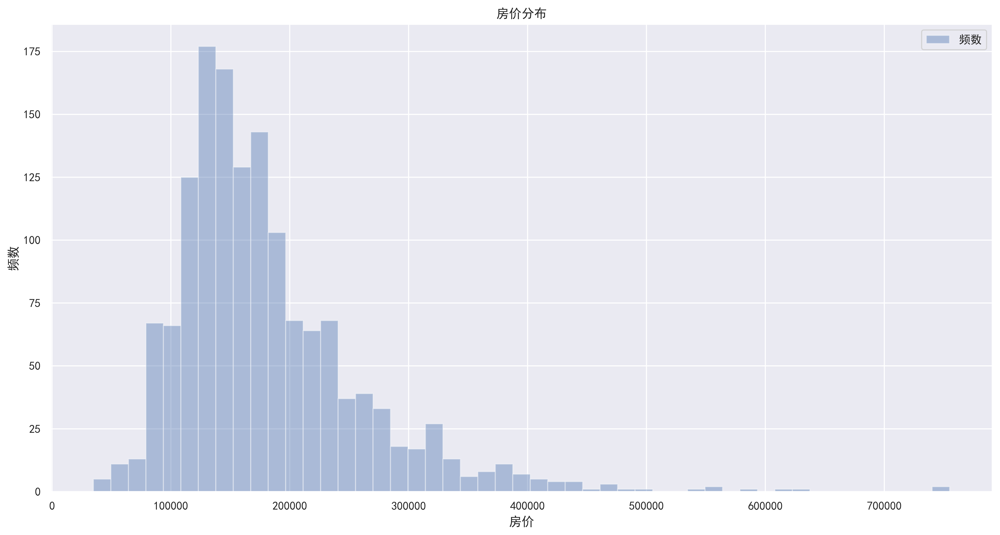

In [5]:
print(df_train['房价'].describe()) #对房价进行描述性统计分析
print("\nSkewness: %f" % df_train['房价'].skew()) #计算偏度值，数据右偏
print("Kurtosis: %f" % df_train['房价'].kurt()) #计算峰度值，峰部为尖峰
myfont=FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf') #设置中文字体
seaborn.set(font=myfont.get_name()) #设置绘图风格
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小，分辨率
plt.ylabel('频数') #设置纵轴标签
plt.title('房价分布') #设置图片标题
      
#distplot函数，给定一组连续值的数据，将它们分成若干小段，统计每个小段中数据的个数，并画出他们的直方图。
#若kde=Ture，则绘制拟合曲线（核密度估计曲线），hist_kws设置柱状图的图例标签为频数。
seaborn.distplot(df_train['房价'],kde=False,hist_kws={"label":"频数"})
plt.legend() #显示图例

1.3.查看特征与标签之间的相关性

作散点图，查看居住面积与房间之间的关系，居住面积越大，房价越高。

<AxesSubplot:xlabel='居住面积', ylabel='房价'>

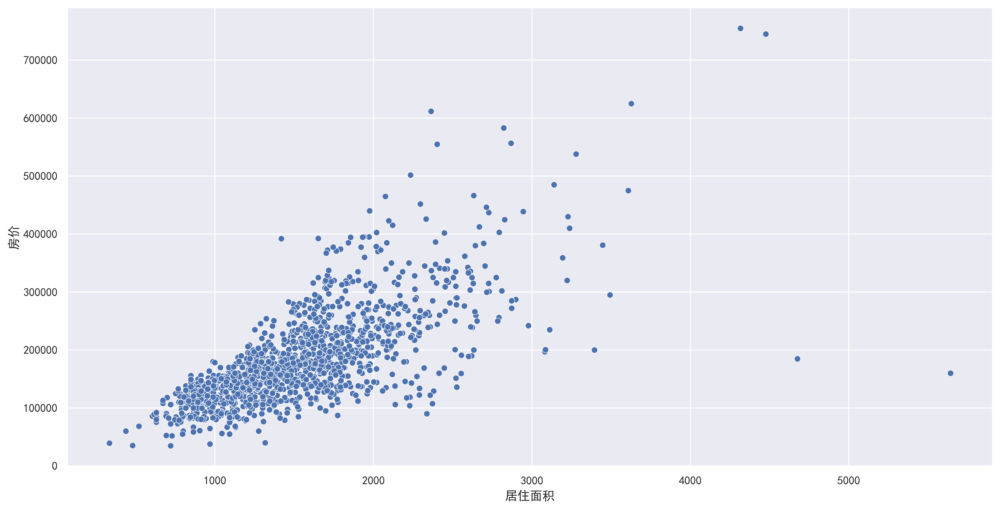

In [6]:
data = pd.concat([df_train['房价'], df_train['居住面积']], axis=1) #拼接两个序列
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小，分辨率
seaborn.scatterplot(data['居住面积'],data['房价']) #作散点图

作散点图，查看地下室总面积与房价之间的关系，地下室总面积越大，房价越高

<AxesSubplot:xlabel='地下室总面积', ylabel='房价'>

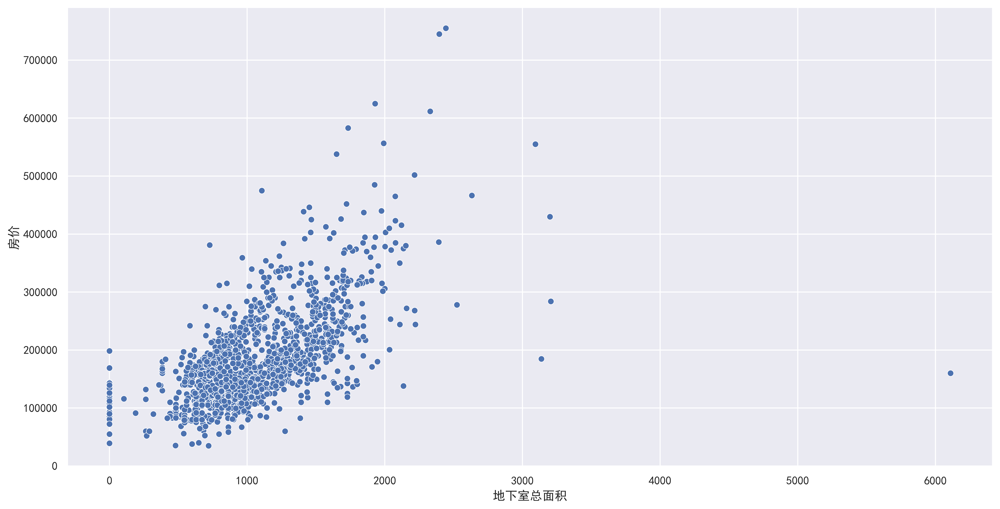

In [7]:
data = pd.concat([df_train['房价'], df_train['地下室总面积']], axis=1) #拼接两个序列
plt.figure(figsize=(16, 8),dpi=600) #这是图片大小，分辨率
seaborn.scatterplot(data['地下室总面积'],data['房价']) #作散点图

作盒须图，查看材料和质量与房价之间的关系，材料和质量等级越高的房子房价越高。

盒须图从上到下的5条横线分别代表最大值，四分之三分位数（Q3）、中位数、四分之一分位数（Q1）和最小值。剩余的点是离群点。；离群点是指比Q3大1.5倍IQR（Q3-Q1）和比Q1小1.5倍IQR的值。

<AxesSubplot:xlabel='材料和质量', ylabel='房价'>

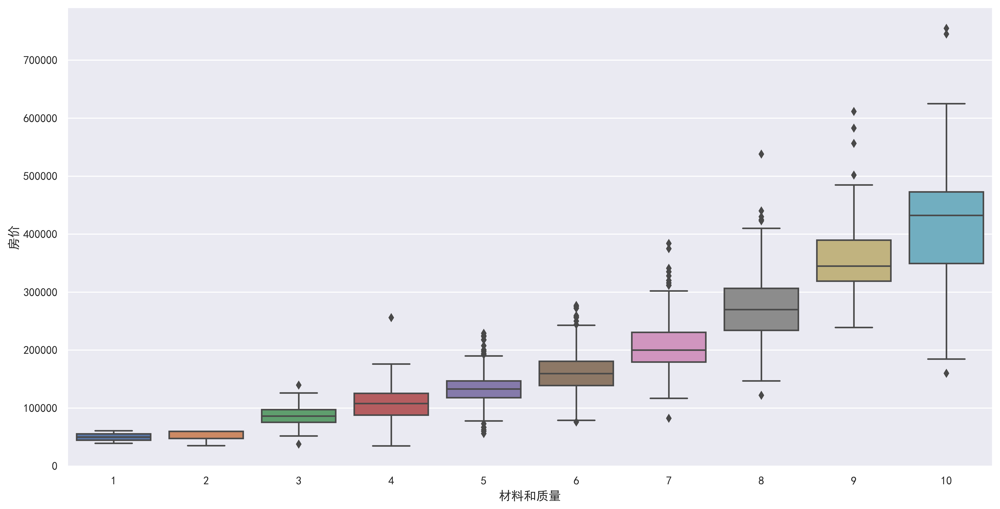

In [8]:
data = pd.concat([df_train['房价'], df_train['材料和质量']], axis=1) #拼接两个序列
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
seaborn.boxplot(data=data,x='材料和质量', y="房价") #画出盒须图

作盒图，查看原施工日期和房价之间的关系，随着原施工日期的变化，房价呈现两头高中间低的趋势。

<AxesSubplot:xlabel='原施工日期', ylabel='房价'>

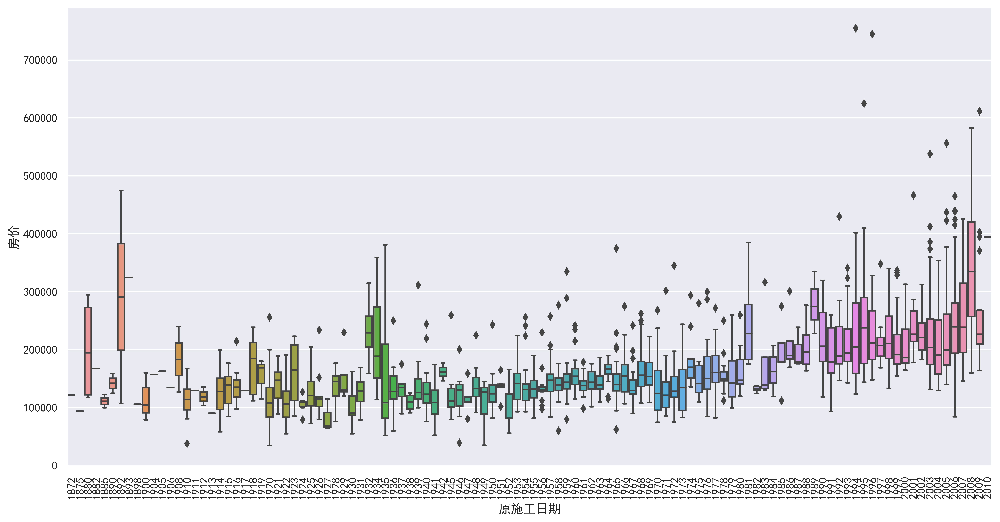

In [9]:
data = pd.concat([df_train['房价'], df_train['原施工日期']], axis=1) #拼接两个序列
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
plt.xticks(rotation=90) #将横坐标选择90度
seaborn.boxplot(data=data,x='原施工日期', y="房价") #画出盒图

作盒图，查看不同街区和房价之间的关系，不同街区的房子的价格差异明显

<AxesSubplot:xlabel='街区', ylabel='房价'>

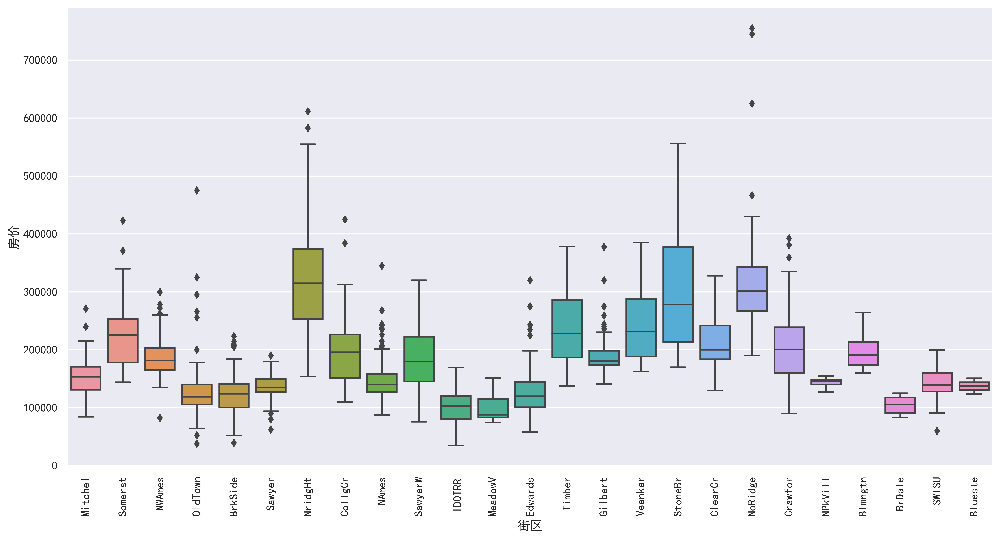

In [10]:
data = pd.concat([df_train['房价'], df_train['街区']], axis=1) #拼接两个序列
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
plt.xticks(rotation=90) #横坐标选择90度
seaborn.boxplot(data=data,x='街区', y="房价" ) #画图盒图

作热力图，查看所有数值型特质之间的相关性。

<AxesSubplot:>

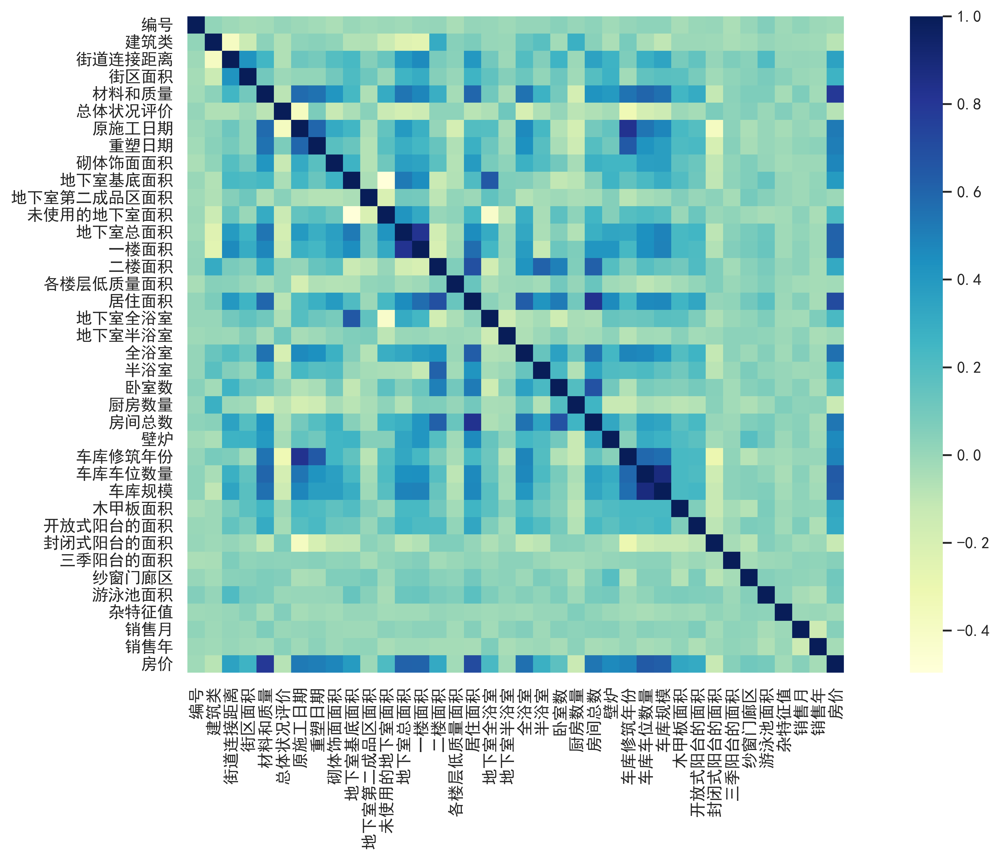

In [11]:
corrmat = df_train.corr() #计算相关系数矩阵
plt.figure(figsize=(16, 8),dpi=600) #设置图片的大小和分辨率
plt.rcParams['axes.unicode_minus'] = False #解决图像中负号显示为方框的问题

#corrmat相关系数矩阵，square=True代表热力图中的格子为正方形，cmap='YlGnBu'代表热力图颜色由黄绿蓝构成，
#xticklabels代表x轴刻度上显示的值
seaborn.heatmap(corrmat,square=True,cmap='YlGnBu',xticklabels=True,yticklabels=True) #画出热力图

从上诉特征中，找出与房价的相关系数排名靠前的10个特征，画出这10个特征之间的热力图。

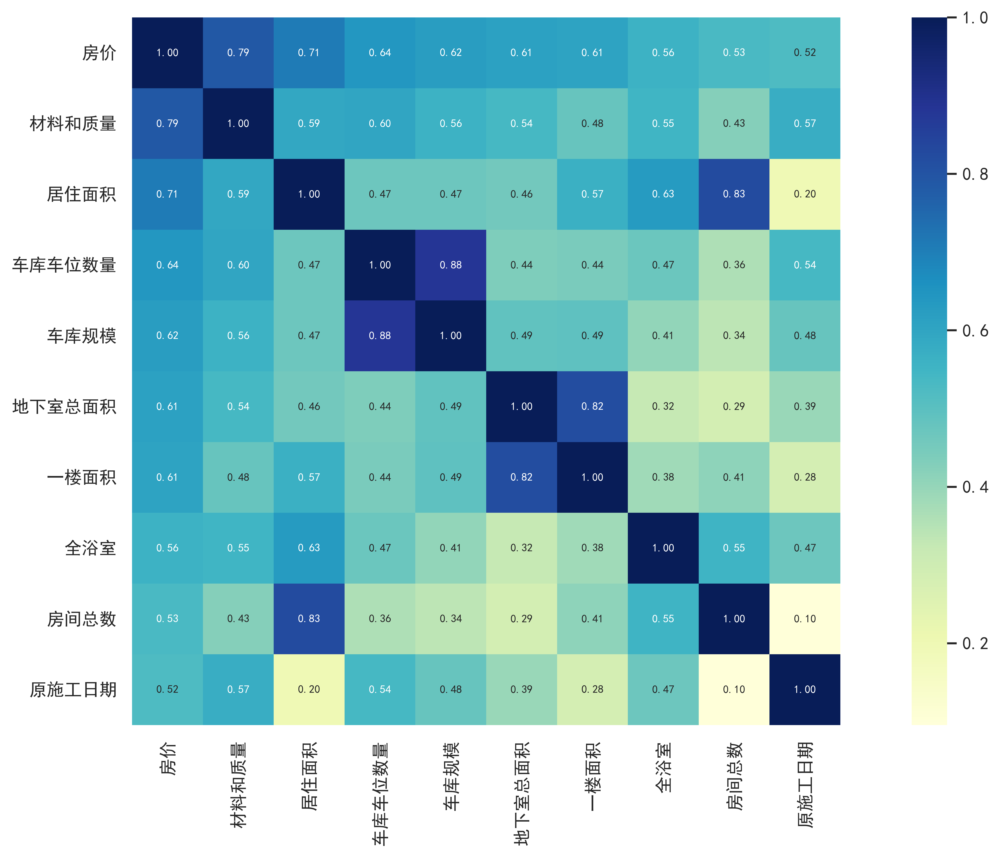

In [12]:
k = 10 #热力图中变量个数
#nlargest代表first n rows with the largest values
cols = corrmat.nlargest(k, '房价')['房价'].index #取出房价的相关系数排名靠前的10个特征的名字
#corrcoef中rowvar参数默认为True，代表把每行当做一个变量，因此传入的列向量构成的矩阵需要转置
cm = np.corrcoef(df_train[cols].values.T) #corr和corrcoef都是计算相关系数的函数，前者作用于dataframe的数据结构，后者作用于数组

plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
#画出热力图，cm为相关系数矩阵，cbar指是否用颜色条作为图例，annot指是否在热力图的每个单元上显示数值，
#square=True指图中的格子是否为正方形，fmt指数字保留两位小数，annot_kws指定数字大小
hm = seaborn.heatmap(cm, annot=True, square=True, fmt='.2f', annot_kws={'size': 7}, 
                 yticklabels=cols.values, xticklabels=cols.values,cmap='YlGnBu')

上诉结果解释：材料和质量、居住面积、车库和车位数量等特征与标签有较强的相关性。

统计每个特征中缺失值的个数

In [13]:
total_isnull = df_train.isnull().sum().sort_values(ascending=False)
total_isnull

泳池质量       1443
杂项功能       1397
通道入口的类型    1359
栅栏的质量      1171
壁炉质量        687
           ... 
外部材料质量        0
第二外部材料        0
第一外部材料        0
屋面材料          0
房价            0
Length: 81, dtype: int64

In [14]:
total_number_rows=len(df_train) #统计总行数
percent = (total_isnull/total_number_rows)*100 #计算各属性缺失值所占的比例

missing_data = pd.concat([total_isnull, percent], axis=1, keys=['缺失值数量', '百分比']) #拼接序列
missing_data.head(20) #显示前20行

,缺失值数量,百分比
泳池质量,1443,99.517241
杂项功能,1397,96.344828
通道入口的类型,1359,93.724138
栅栏的质量,1171,80.758621
壁炉质量,687,47.379310
街道连接距离,259,17.862069
车库修筑年份,81,5.586207
车库条件,81,5.586207
车库类型,81,5.586207
车库室内装修,81,5.586207


2.数据预处理

2.1.查看并删除离群点

读入训练集和测试集，特征编号暂时不会用到，删除编号后查看训练集和测试集的的形状。

In [15]:
train = pd.read_csv(r'data/data_train.csv',encoding='gbk') #读入训练数据
test = pd.read_csv(r'data/data_test.csv',encoding='gbk') #读入测试数据

print("The train data size before dropping Id feature is : （%d %d）" %(train.shape[0],train.shape[1])) #查看训练数据集的形状
print("The test data size before dropping Id feature is : （%d %d）\n" %(test.shape[0],test.shape[1])) #查看测试数据集的形状

train.drop("编号", axis = 1, inplace = True) #删除训练数据集中ID属性列
test.drop("编号", axis = 1, inplace = True) #删除测试数据集中ID属性列

print("The train data size after dropping Id feature is : （%d %d）" %(train.shape[0],train.shape[1])) #再次查看训练数据集的形状
print("The train data size after dropping Id feature is : （%d %d）" %(test.shape[0],test.shape[1])) #再次查看测试数据集的形状

The train data size before dropping Id feature is : （1450 81）
The test data size before dropping Id feature is : （1449 80）

The train data size after dropping Id feature is : （1450 80）
The train data size after dropping Id feature is : （1449 79）


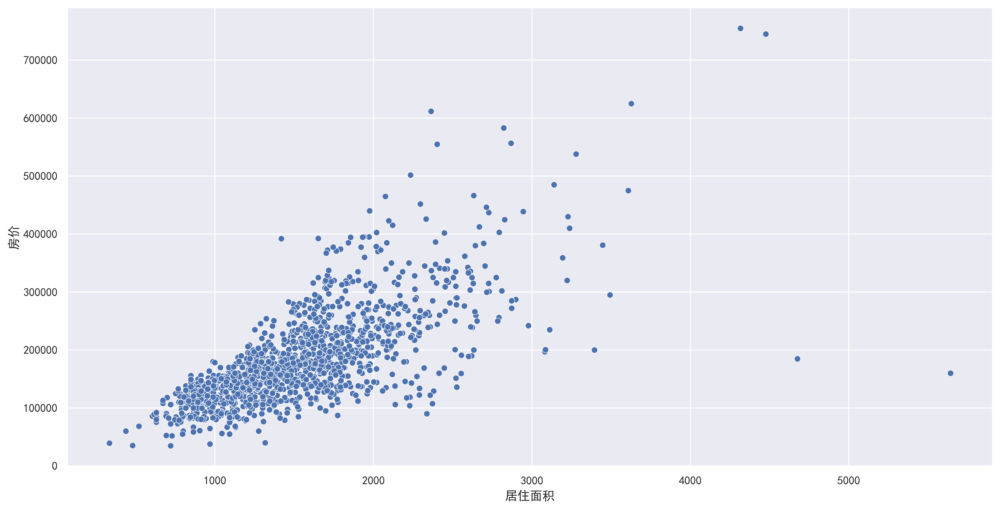

In [16]:
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
fig = seaborn.scatterplot(train['居住面积'],train['房价']) #作散点图

删除离群点，再次作居住面积与房价的散点图，观察离群点是否已经被删除。

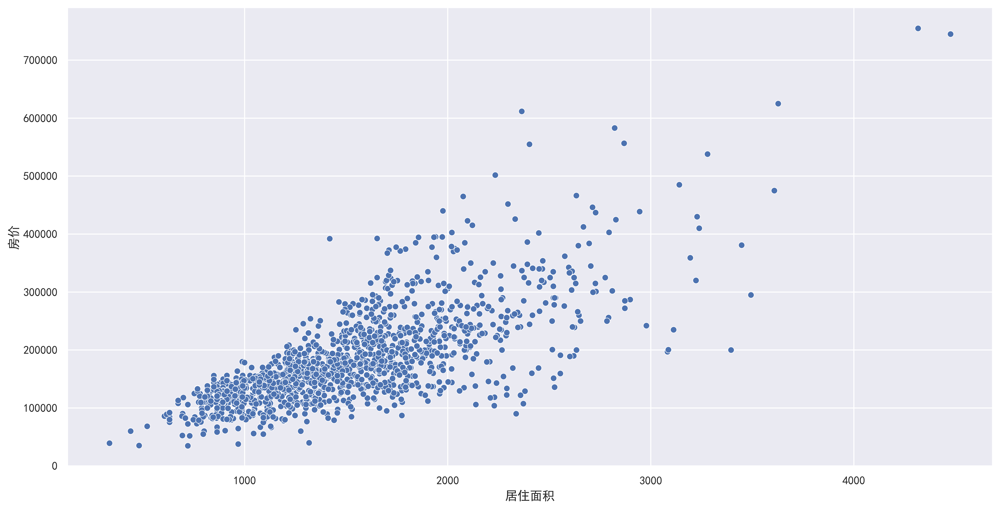

In [17]:
train = train.drop(train[(train['居住面积']>4000) & (train['房价']<300000)].index) #删除离群点

plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
fig = seaborn.scatterplot(train['居住面积'],train['房价']) #作散点图

2.2.对标签进行正态分布化处理

对房价进行正态分布化处理


 mu = 180839.48 and sigma = 79655.69



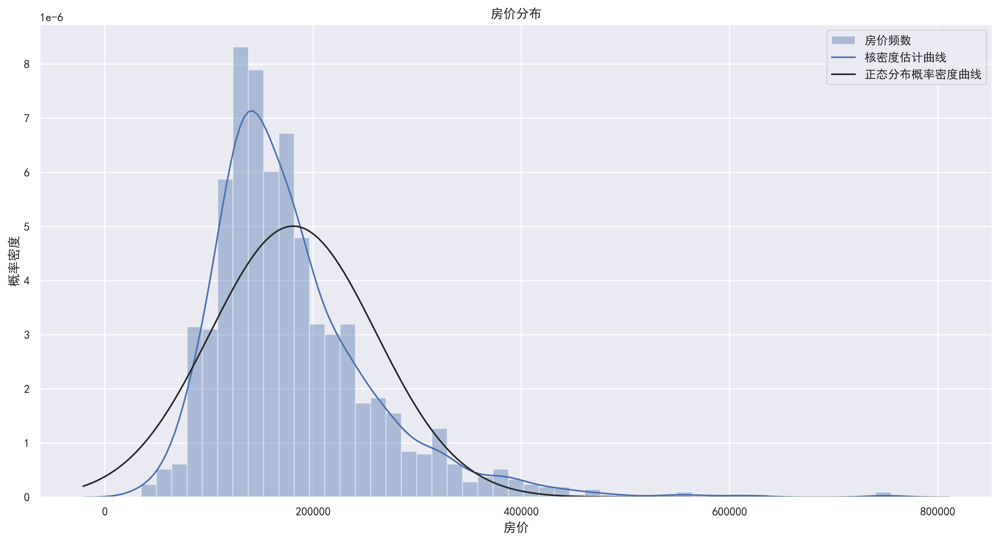

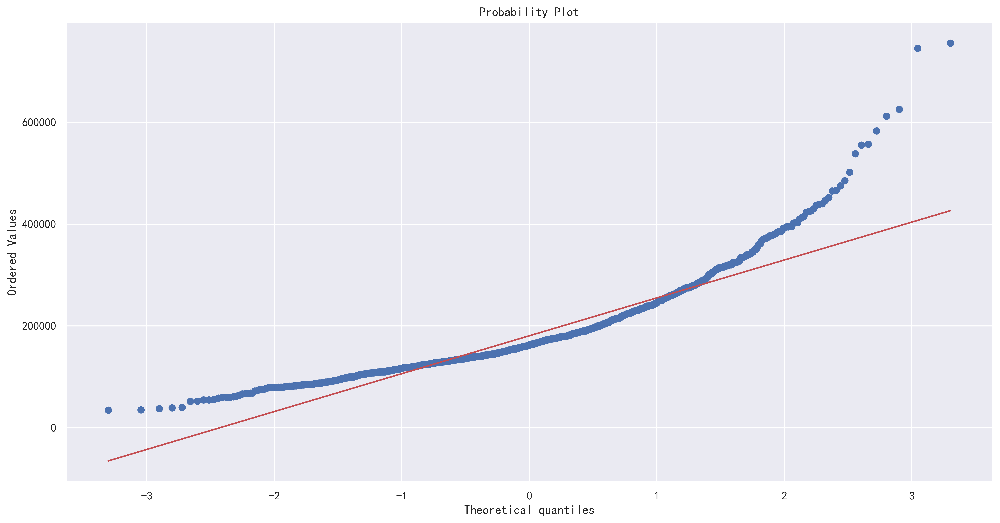

In [18]:
(mu, sigma) = norm.fit(train['房价']) #计算变化前的均值和方差
print("\n mu = %.2f and sigma = %.2f\n" %(mu,sigma)) #打印均值和方差

#画出变换前房价的核密度估计曲线，拟合出正态分布概率密度曲线
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小，分辨率
plt.ylabel('概率密度') #设置纵轴标签
plt.title('房价分布') #设置图片标题
#第一个参数为房价数据，fit=norm代表绘制正态分布概率密度曲线（黑色曲线），kde=True代表绘制核密度估计曲线（蓝色曲线）
#fit_kws,kde_kws,hist_kws分别可以设置黑色曲线，蓝色曲线和直方图的图例标签
seaborn.distplot(train['房价'] ,fit=norm,kde=True,fit_kws={"label":"正态分布概率密度曲线"},
                 kde_kws={"label":"核密度估计曲线"},hist_kws={"label":"房价频数"}) #绘图
plt.legend() #设置图例

plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
res = stats.probplot(train['房价'], plot=plt) #计算概率图的分布图。plt是绘制对象，plot= plt显示该图。

上诉结果解释： <br />
第一张图中蓝色的直方图代表对应区间房价的频数，蓝色曲线为核密度估计曲线，黑色的曲线代表以房价的均值和方差拟合出的正态分布的概率密度曲线。可以看出，观测数据的分布与正态分布有一定差距，故应对观测数据进行正态分布化处理。

第二张图为Q-Q图<br />
蓝色点的作图方法:<br />
1、找出标准正态分布的所有分位点作为义轴的刻度值；<br />
2、找与X轴上所有分位点对应的样本分位点，以标准正态分布分位点为横坐标样本分位点为纵坐标，可以做出Q-Q图中蓝色的点;<br />
红色线的的作图方法:<br />
1、以样本的均值和方美生成一组正本分布样本对应第一张图中黑色的曲线)；<br />
2、出与X轴上所有分位点对应的本分布样本的分代点，以标准正态分布分位点为横坐标，正态分布分位点为纵坐标，可以做出Q-Q图的红色直线。

结论:蓝色的点越贴近直线，越说明观测数据的分布贴近正态分布

对房价进行正态分布化处理，计算变换后的均值和方差，作频数直方图、拟合后的正态分布概率密度曲线、Q-Q图。


 mu = 12.02 and sigma = 0.40



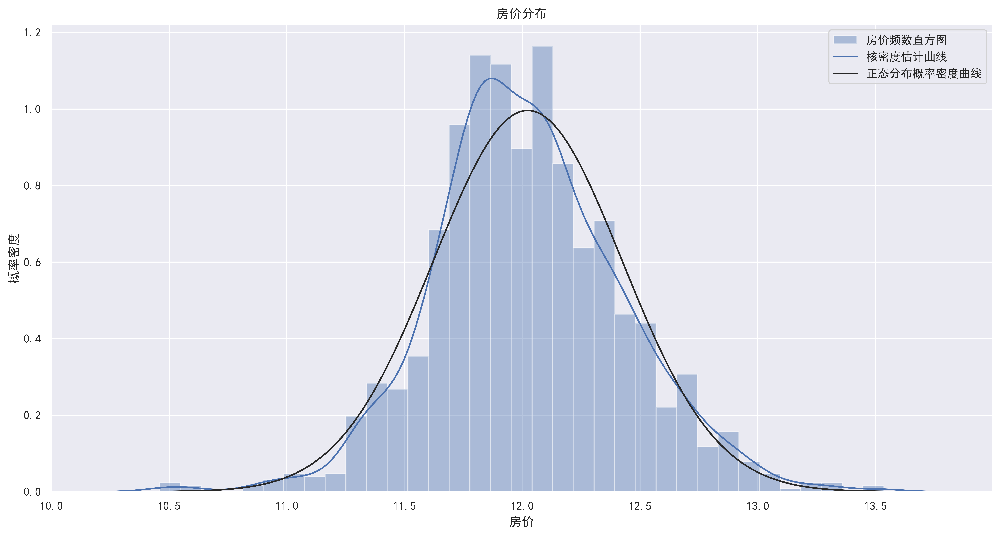

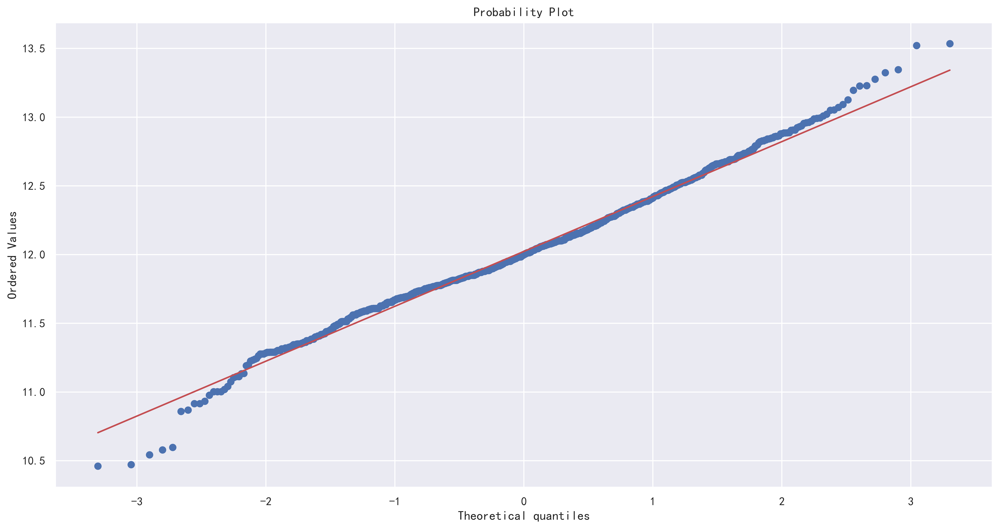

In [19]:
train["房价"] = np.log1p(train["房价"]) #对数变换ln(1+x)

(mu, sigma) = norm.fit(train['房价']) #计算新的均值和方差
print("\n mu = %.2f and sigma = %.2f\n" %(mu,sigma)) #打印均值和方差

plt.figure(figsize=(16, 8),dpi=600) #设置地图大小
plt.ylabel('概率密度') #设置纵轴标签
plt.title('房价分布') #设置图片标题
#第一个参数为房价数据，fit=norm代表绘制正态分布概率密度曲线（黑色曲线），kde=True代表绘制核密度估计曲线（蓝色曲线）
#fit_kws,kde_kws,hist_kws分别可以设置黑色曲线，蓝色曲线和直方图的图例标签
seaborn.distplot(train['房价'] ,fit=norm,kde=True,fit_kws={"label":"正态分布概率密度曲线"},
                 kde_kws={"label":"核密度估计曲线"},hist_kws={"label":"房价频数直方图"})#绘图
plt.legend() #设置图例


plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
res = stats.probplot(train['房价'], plot=plt) #画出QQ图

上述结果解释：正态分布化处理后，核密度估计曲线与拟合出的正态分布概率密度曲线更加贴近，Q-Q图中蓝色的点相比处理前更加贴近直线。因此可以认为，经过对数变换后的房价数据近似服从正态分布，可以用于接下来的回归任务。

In [20]:
ntrain = train.shape[0] #训练集中数据个数
y_train = train['房价'].values #训练集中的房价值,返回一个数组
print(y_train)
all_data = pd.concat((train, test)).reset_index(drop=True) #合并训练集和测试集,reset_index(drop=True)删除就索引，
all_data.drop(['房价'], axis=1, inplace=True) #删除房价这一列属性
print("all_data size is :(%d,%d) " %(all_data.shape[0],all_data.shape[1])) #打印数据形状

[11.8706069  12.63460628 12.20607765 ... 11.88449592 11.34451865
 12.12811651]
all_data size is :(2897,79) 


计算所有特征缺失值占比

In [21]:
#计算所有属性的缺失值占比
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na #返回一个serise的数据结构(无columns),第一列为index，第二列为values

建筑类        0.000000
一般分区       0.138074
街道连接距离    16.775975
街区面积       0.000000
道路类型       0.000000
            ...    
杂特征值       0.000000
销售月        0.000000
销售年        0.000000
销售类型       0.034518
销售条件       0.000000
Length: 79, dtype: float64

In [22]:
#去掉不包含缺失值的属性，并对剩下的属性按照缺失值比例降序排列，存下排名前十的属性
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:10]
#转换成dataframe格式
missing_data = pd.DataFrame({'缺失值占比' :all_data_na})
#展示
missing_data

,缺失值占比
泳池质量,99.689334
杂项功能,96.479116
通道入口的类型,93.165343
栅栏的质量,80.462547
壁炉质量,48.705557
街道连接距离,16.775975
车库室内装修,5.419399
车库质量,5.419399
车库条件,5.419399
车库修筑年份,5.419399


绘制上述10个包含缺失值特征的缺失占比条形图

<AxesSubplot:title={'center':'各个特征的缺失值占比图'}, xlabel='特征', ylabel='缺失值占比'>

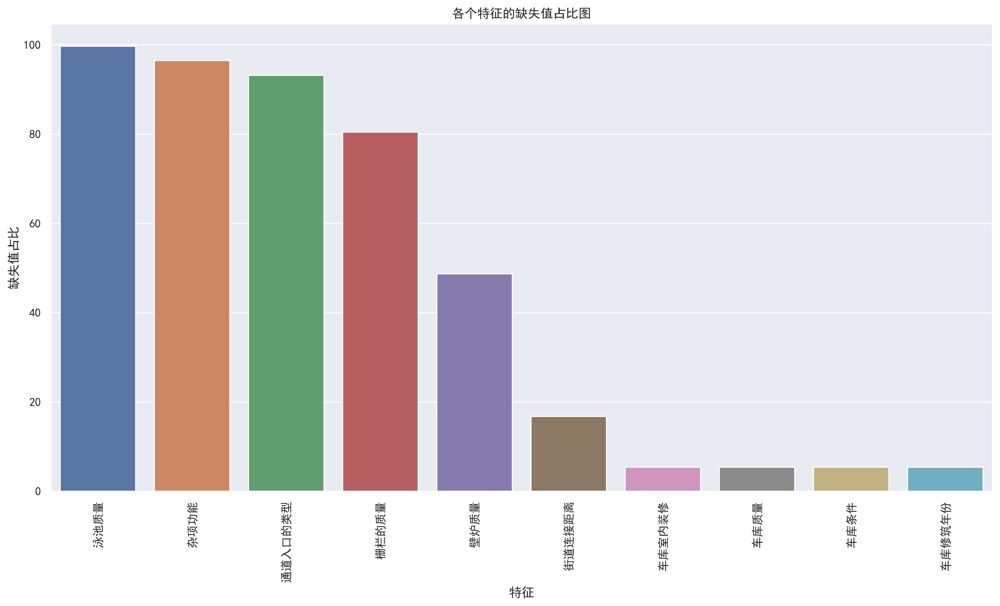

In [23]:
plt.figure(figsize=(16, 8),dpi=600) #设置图片大小
plt.xticks(rotation='90') #坐标选择90度
plt.xlabel('特征') #设置横轴坐标
plt.ylabel('缺失值占比') #设置A纵轴坐标
plt.title('各个特征的缺失值占比图')#设置标题
seaborn.barplot(x=all_data_na.index, y=all_data_na)#画出直方图

填补缺失值，根据特征的现实意义，采用‘None’进行填充

In [24]:
cols = ('泳池质量','车库类型', '车库室内装修', '车库质量', '车库条件','地下室的高度','地下室的条件','花园层地下室墙',
        '地下室基底质量','地下室第二成品区质量','砌体饰面型','砌体饰面型','杂项功能','通道入口的类型',
        '栅栏的质量','壁炉质量','建筑类','实用工具') #将需要转换的列存入元组                     

for col in cols:
    all_data[col] = all_data[col].fillna('None')
    
all_data['泳池质量']

0       None
1       None
2       None
3       None
4       None
        ... 
2892    None
2893    None
2894    None
2895    None
2896    None
Name: 泳池质量, Length: 2897, dtype: object

填充‘街道连接距离’，采用不同街区的街道连接距离的中位数进行填充。

In [25]:
#先利用groupby函数将数据按照“街区”进行分组，取出‘街道连接距离’这一列
list(all_data.groupby('街区')['街道连接距离'])[0:3]

[('Blmngtn',
  214     43.0
  224     43.0
  380     43.0
  438     53.0
  460      NaN
  553      NaN
  591     53.0
  633     53.0
  784     43.0
  845      NaN
  976     43.0
  998     43.0
  1013    43.0
  1017    43.0
  1120    53.0
  1387    53.0
  1408    51.0
  1466    43.0
  1668    43.0
  1967     NaN
  1968     NaN
  1969    53.0
  2303     NaN
  2304    53.0
  2654    43.0
  2655     NaN
  2656     NaN
  2657    43.0
  Name: 街道连接距离, dtype: float64),
 ('Blueste',
  593     24.0
  950     24.0
  1581    35.0
  1582    35.0
  1890    24.0
  1891    24.0
  1892    24.0
  2192    24.0
  2552    24.0
  2554    35.0
  Name: 街道连接距离, dtype: float64),
 ('BrDale',
  220     21.0
  222     21.0
  227     21.0
  230     21.0
  358     21.0
  425     21.0
  427     24.0
  495     21.0
  649     21.0
  831     21.0
  1023    21.0
  1098    24.0
  1213    21.0
  1285    21.0
  1327    24.0
  1371    21.0
  1454    21.0
  1455    21.0
  1634    21.0
  1635    21.0
  1944    21.0
  1945    2

上述结果解释：列表中每一个元素包括街区名称，以及该街区对应的街道连接距离

In [26]:
#下方代码中的x指上述结果中的某街区对应的一组街道连接距离。求该街区的街道连接距离的中位数，用该中位数填充该街区的缺失值。
all_data['街道连接距离'] = all_data.groupby('街区')['街道连接距离'].transform(lambda x: x.fillna(x.median()))
all_data['街道连接距离']

0       85.0
1       75.0
2       80.0
3       51.0
4       50.0
        ... 
2892    21.0
2893    21.0
2894    80.0
2895    21.0
2896    21.0
Name: 街道连接距离, Length: 2897, dtype: float64

填充缺失值，根据特征的现实意义，采用0填充

In [27]:
cols = ('车库修筑年份','车库规模','车库车位数量','地下室基底面积','地下室第二成品区面积',
        '未使用的地下室面积','地下室总面积','地下室全浴室','地下室半浴室','砌体饰面面积','砌体饰面面积') #将需要转化的列存入元组                  
for col in cols:
    all_data[col] = all_data[col].fillna(0)
    
all_data['车库规模']

0       480.0
1       636.0
2       484.0
3       468.0
4       205.0
        ...  
2892      0.0
2893    253.0
2894    336.0
2895    286.0
2896      0.0
Name: 车库规模, Length: 2897, dtype: float64

填充缺失值，根据特征的现实意义，采用众数进行填充。

In [28]:
cols = ('一般分区','电气系统','厨房的品质','第一外部材料','第二外部材料','家庭功能评级','销售类型') #将需要转化的列存入元组               
for col in cols:
    all_data[col] = all_data[col].fillna(all_data[col].mode()[0]) 
all_data['厨房的品质']

0       TA
1       Gd
2       TA
3       TA
4       TA
        ..
2892    TA
2893    TA
2894    TA
2895    TA
2896    TA
Name: 厨房的品质, Length: 2897, dtype: object

再次计算各特征缺失值比例，查看缺失值是否已经填充完毕。

In [29]:
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100#计算缺失值比例
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)#去掉不包含缺失值的属性并对剩下的属性排序
missing_data = pd.DataFrame({' 缺失值占比' :all_data_na})#转化成DataFrame格式。
missing_data.head()#显示前几行

,缺失值占比


2.4.对离散数据进行数值化编码。

对某些具有多种类别的特征进行数值化编码，为这些特征的类别打上新的标签。

以壁炉的质量为例，映射前后的特征对比如下所示：

In [30]:
c='壁炉质量'#c是循环中的变量，此处以壁炉质量为例，进行数值化编码
all_data_c_list=list(all_data[c].values)#创建列表，存放变量
all_data_c_list_df=pd.DataFrame(all_data_c_list,columns=['beforeTransform'])#创建数据框，存放映射前的特征

from sklearn.preprocessing import LabelEncoder                 
myLabel = LabelEncoder() #创建LabelEncoder对象                            
myLabel.fit(all_data_c_list) #预编译，建立映射关系                           
all_data_c_list_transform= myLabel.transform(all_data_c_list) #实际编译，根据映射关系进行值转换
all_data_c_list_transform_df=pd.DataFrame(all_data_c_list_transform,columns=['afterTransform'])#创建数据框，存放映射后的特征。

pd.concat([all_data_c_list_df,all_data_c_list_transform_df],axis=1).head(15) #合并存放了映射前后的两个数据框

,beforeTransform,afterTransform
0,None,3
1,Gd,2
2,TA,5
3,TA,5
4,TA,5
5,None,3
6,Gd,2
7,None,3
8,Gd,2
9,Fa,1


In [31]:
print(all_data['建筑类'])#映射前的属性是数值型的，但不连续

all_data['建筑类'] = all_data['建筑类'].apply(str)#将数据转成字符串的形式
all_data['总体状况评价'] = all_data['总体状况评价'].apply(str)
all_data['销售年'] = all_data['销售年'].apply(str)
all_data['销售月'] = all_data['销售月'].apply(str)

0        50
1        20
2        60
3        50
4       190
       ... 
2892    180
2893    160
2894     20
2895    160
2896    160
Name: 建筑类, Length: 2897, dtype: int64


使用sklearn库对cols里的所有特征进行数值化映射和转换

In [32]:
from sklearn.preprocessing import LabelEncoder
cols = ('壁炉质量', '地下室的高度', '地下室的条件', '车库质量', '车库条件', 
        '外部材料质量', '外部材料条件','加热质量', '泳池质量', '厨房的品质', '地下室基底质量', 
        '地下室第二成品区质量', '家庭功能评级', '栅栏的质量', '花园层地下室墙', '车库室内装修', '坡的财产',
        '财产的类型', '车道', '道路类型', '通道入口的类型', '中央空调', '建筑类', '总体状况评价', 
        '销售年', '销售月')  #将需要转换的列存入元组                    

for c in cols:
    myLabel = LabelEncoder() #创建LabelEncoder对象
    myLabel.fit(list(all_data[c].values))#建立值和类别的映射关系
    all_data[c] = myLabel.transform(list(all_data[c].values))#将每一个值按照映射关系进行转换
        
print('Shape all_data: (%d,%d)'%(all_data.shape[0],all_data.shape[1]))    

Shape all_data: (2897,79)


2.5.增加新特征：总面积

In [33]:
all_data['总面积'] = all_data['地下室总面积'] + all_data['一楼面积'] + all_data['二楼面积']

2.6.对特征进行正态分布化处理

在进行回归预测前，要保证所有的自变量和因变量都服从或近似服从正态分布。<br/>
检验所有特征的正态性，计算特征的偏度值，对不符合正态分布的特征进行BOX-COX转换

In [34]:
all_data.dtypes

建筑类         int32
一般分区       object
街道连接距离    float64
街区面积        int64
道路类型        int32
           ...   
销售月         int32
销售年         int32
销售类型       object
销售条件       object
总面积       float64
Length: 80, dtype: object

In [35]:
from scipy.stats import norm, skew
numeric_feats = all_data.dtypes[all_data.dtypes != "object"].index #找出所有数值型属性的索引值
skewed_feats = all_data[numeric_feats].apply(lambda x: skew(x)).sort_values(ascending=False)#计算所有数值型数据的偏度值
print("\n所有数值型特征的偏度为: \n")#打印
skewness = pd.DataFrame({'偏度值' :skewed_feats})#转换成数据框
skewness.head(10)#查看前十行


所有数值型特征的偏度为: 



,偏度值
杂特征值,24.221986
游泳池面积,17.627341
街区面积,13.100769
各楼层低质量面积,12.042235
三季阳台的面积,11.332155
坡的财产,4.976369
厨房数量,4.283471
地下室第二成品区面积,4.146882
封闭式阳台的面积,4.006466
纱窗门廊区,3.944876


对偏度值的绝对值大于0.75的特征进行BOX-COX转换

In [36]:
skewness = skewness[abs(skewness) > 0.75] #保留偏度值的绝对值大于0.75的特征
print("总共有 %d 个特征需要进行BOX-COX变换" %skewness.shape[0])#打印有多少个特征
from scipy.special import boxcox1p
skewed_features = skewness.index #将特征名称保存在skewed_features中
lam = 0.15 #一般情况下0.15为经验值
for feat in skewed_features:
    all_data[feat] = boxcox1p(all_data[feat], lam) #进行BOX-COX变换

总共有 59 个特征需要进行BOX-COX变换


2.7.对离散特征进行独热编码

对数据进行独热编码。<br/>
以销售类型为例，独热编码前如下所示：

In [37]:
sale_contion=all_data['销售条件']
sale_contion

0        Normal
1        Normal
2        Normal
3       Abnorml
4        Normal
         ...   
2892     Normal
2893     Normal
2894     Normal
2895    Abnorml
2896     Normal
Name: 销售条件, Length: 2897, dtype: object

独热编码后如下所示，根据特征中包含的分类数量n，原数据被拆分成n个新的列，每个元素属于哪一个分类，该类对应的元素值为1，否则为0

In [38]:
sale_contion_afterDummies=pd.get_dummies(sale_contion) #热编码
sale_contion_afterDummies

,Abnorml,AdjLand,Alloca,Family,Normal,Partial
0,0,0,0,0,1,0
1,0,0,0,0,1,0
2,0,0,0,0,1,0
3,1,0,0,0,0,0
4,0,0,0,0,1,0
...,...,...,...,...,...,...
2892,0,0,0,0,1,0
2893,0,0,0,0,1,0
2894,0,0,0,0,1,0
2895,1,0,0,0,0,0


对整体进行热编码

In [39]:
all_data = pd.get_dummies(all_data) #热编码
print(all_data.shape)#打印数据形状
all_data

(2897, 223)


,建筑类,街道连接距离,街区面积,道路类型,通道入口的类型,财产的类型,坡的财产,材料和质量,总体状况评价,原施工日期,...,销售类型_ConLw,销售类型_New,销售类型_Oth,销售类型_WD,销售条件_Abnorml,销售条件_AdjLand,销售条件_Alloca,销售条件_Family,销售条件_Normal,销售条件_Partial
0,2.750250,6.337529,21.282283,0.730463,0.730463,0.000000,0.000000,2.055642,1.820334,14.171884,...,0,0,0,1,0,0,0,0,1,0
1,2.055642,6.098626,19.907529,0.730463,0.730463,1.540963,0.000000,2.602594,1.820334,14.189087,...,0,0,0,1,0,0,0,0,1,0
2,2.885846,6.221214,20.023862,0.730463,0.730463,0.000000,0.000000,2.440268,2.055642,14.140398,...,0,0,0,1,0,0,0,0,1,0
3,2.750250,5.392276,17.989871,0.730463,0.730463,1.540963,0.000000,2.440268,1.820334,14.073384,...,0,0,0,1,1,0,0,0,0,0
4,1.820334,5.357203,18.712544,0.730463,0.730463,1.540963,0.000000,2.055642,2.055642,14.086243,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2892,1.540963,3.932510,13.242388,0.730463,0.730463,1.540963,0.000000,1.820334,2.055642,14.135652,...,0,0,0,1,0,0,0,0,1,0
2893,1.194318,3.932510,13.270696,0.730463,0.730463,1.540963,0.000000,1.820334,1.540963,14.138816,...,0,0,0,1,0,0,0,0,1,0
2894,2.055642,6.221214,21.060245,0.730463,0.730463,1.540963,0.730463,2.055642,1.820334,14.134068,...,0,0,0,1,0,0,0,0,1,0
2895,1.194318,3.932510,13.368020,0.730463,0.730463,1.540963,0.000000,1.820334,1.820334,14.135652,...,0,0,0,1,1,0,0,0,0,0


划分出训练集和测试集。

In [40]:
train = all_data[:ntrain] #训练集
test = all_data[ntrain:] #测试集

3.建立模型

导入相关工具包

In [41]:
from sklearn.pipeline import make_pipeline #级联其他函数的的工具
from sklearn.preprocessing import RobustScaler #自动处理离群点的函数
from sklearn.linear_model import ElasticNet, Lasso #弹性回归，套索回归
from sklearn.kernel_ridge import KernelRidge # 核岭回归
from sklearn.ensemble import GradientBoostingRegressor #梯度提升回归
import xgboost as xgb #xgb包中包含极端梯度提升回归模型XGBRegressor
#自定义的集成模型类需要继承sklearn中的三个类：估计器的基类；转换器的混合类；回归估计器的混合类。clone是产生克隆估计器的函数
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
#用于划分数据集，计算模型得分的函数
from sklearn.model_selection import KFold, cross_val_score,train_test_split

3.1.建立单模型

建立5个回归模型，分别是套索回归（lasso）、弹性回归（ElasticNet）、岭回归（Ridge Regression）、<br/>梯度提升回归（GradientBoostingRegressor）、极端梯度提升（XGBRegressor）。

In [42]:
#lasso模型，在线性回归模型的基础上加入了L1正则化的回归方法。
#alpha代表正则化惩罚力度，random_state指随机种子。
#正则化项为alpha*||w||_1
Lasso = Lasso(alpha =0.0005, random_state=0)

#KernelRidge带有核函数的岭回归，岭回归也是在线性回归模型的基础上加入了L2正则化的回归方法。
#alpha代表正则化惩罚力度
#正则化项为0.5*alpha*||w||'2_2
#kernel='polynomial'指核函数的类型为多项式核函数，K(x,xi)=((x+xi)+R)的d次方，degree指poly核中的参数d
KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2)

#ElasticNet弹性回归是套索回归和岭回归的混合模型，同时引入了L1和L2正则化项。
#alpha代表正则化惩罚力度，random_state指随机种子。
#正则化项为alpha*L1_ratio*||w||_1+0.5*alpha*(1-L1_ratio)*||w||'2_2
ENet = ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=0)

#GradientBoostingRegressor梯度提升回归，是一种集成回归算法。
#n_estimators指弱学习器的数目，learning_rate指学习率， max_depth指每个学习器的最大深度；
#max_features特征子集中的特征个数、max_features='sqrt'代表特征总数的平方；random_state指随机因子
GBR = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt', random_state =0)

#XGBRegressor极大梯度提升回归，是在梯度提升回归模型上经过优化的集成回归算法。
#n_estimators指弱学习器的数目，learning_rate指学习率， max_depth指每个学习器的最大深度；、
#reg_alpha指权重的L1正则化项；reg_lambda指权重L2正则化项；
XGBR = xgb.XGBRegressor(n_estimators=2200,learning_rate=0.05, max_depth=3, 
                        reg_alpha=0.4640, reg_lambda=0.8571)


3.2.建立集成模型

编写建立平均模型的类

In [43]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
#定义原始模型的克隆来训练数据
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        #训练克隆模型
        for model in self.models_:
            model.fit(X, y)
        return self
    
    #克隆模型进行预测并求平均
    def predict(self, X):
        #column_stack将3个n*1的矩阵拼接成n*3的矩阵
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1) #axis=1：压缩列，对各列求均值，返回n*1矩阵

编写建立堆叠模型的类

In [44]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
    #定义原始模型的克隆啦姿训练模型
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=0)
        #训练克隆的基础模型（第一阶段模型），将产生的结果存入out_of_fold中，利用out_of_fold中的数据训练元模型（第二阶段的模型）
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
        #现在将out_of_fold里的数据作为特征，拿到元模型（第二阶段）的模型中进行拟合
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
    #用所有基础模型（第一阶段的模型）预测测试集上的数据，将预测结果的平均值拿到元模型（第二阶段的模型）中进行最后的预测。
    def predict(self, X):
        #base_models_是一个的二维模型，如下所示（以ENet、GBR、KRR3个基础模型为例）:
        #每一行代表一个基模型5次交叉验证生成的5个模型，一共有3个模型，故有3行。
        #[[ENet_1,ENet_2,ENet_3,ENet_4,ENet_5],
        #[GBR_1,GBR_2,GBR_3,GBR_4,GBR_5],
        #[KRR_1,KRR_2,KRR_3,KRR_4,KRR_5]]
        
        #np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)对每一行的5个模型的预测结果求均值，返回的是一个n*1的矩阵
        #外层的column_stack是将3个基模型的预测结果拼接处n*3的矩阵
        #因此，meta_features是一个n*3的矩阵，每一列代表一个基模型的5次交叉验证的预测值的平均值，共有3个基模型，所以meta_features有3列
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)

4.模型评估

4.1.编写评估模型的函数

编写评估模型的函数，计算均方根误差。

In [45]:
n_folds = 5 #交叉验证的折数
def rmse_cv(model):#编写函数，计算各个模型的均方根误差
    kf = KFold(n_folds, shuffle=True, random_state=0).get_n_splits(train.values)#划分交叉验证需要用到的数据集
    #scoring="neg_mean_squared_error"是计算均方误差回归损失，返回值是负值，故需要在函数外添加负号，再开平方，得到均方根误差
    rmse= np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)#返回计算出的均方根误差

4.2.计算各模型的均方根误差

计算lasso模型的均方根误差

In [46]:
score = rmse_cv(Lasso)
print("\nLasso score: %.4f (%.4f)\n" %(score.mean(),score.std()))


Lasso score: 0.1137 (0.0077)



计算KRR模型的均方根误差

In [47]:
score = rmse_cv(KRR)
print("Kernel Ridge score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Kernel Ridge score:  0.1168 (0.0073)



计算ENet模型的均方根误差

In [48]:
score = rmse_cv(ENet)
print("ElasticNet score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

ElasticNet score:  0.1136 (0.0077)



计算GBoost模型的均方根误差

In [49]:
score = rmse_cv(GBR)
print("Gradient Boosting score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Gradient Boosting score:  0.1152 (0.0074)



计算XGBR模型的均方根误差

In [50]:
score = rmse_cv(XGBR)
print("Xgboost score: %.4f (%.4f)\n" %(score.mean(),score.std()))

Xgboost score: 0.1198 (0.0067)



计算平均模型的均方根误差

In [51]:
averaged_models = AveragingModels(models = (ENet, GBR, KRR, Lasso))

score = rmse_cv(averaged_models)
print(" Averaged base models score: %.4f (%.4f)\n" %(score.mean(),score.std()))

 Averaged base models score: 0.1097 (0.0078)



计算由不同模型组合而成的堆叠模型的均方根误差

In [ ]:
stacked_averaged_models1 = StackingAveragedModels(base_models = (ENet, GBR, KRR),
                                                 meta_model = Lasso)#以lasso作为元模型，建立堆叠模型

score = rmse_cv(stacked_averaged_models1)#计算均方根误差
print("Stacking Averaged models1 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))#打印

In [ ]:
stacked_averaged_models2 = StackingAveragedModels(base_models = (Lasso, GBR, KRR),
                                                 meta_model = ENet)#以ENet作为元模型，建立堆叠模型
 
score = rmse_cv(stacked_averaged_models2)#计算均方根误差
print("Stacking Averaged models2 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

In [ ]:
stacked_averaged_models3 = StackingAveragedModels(base_models = (ENet, Lasso, KRR),
                                                 meta_model = GBR)#以GBR作为元模型，建立堆叠模型

score = rmse_cv(stacked_averaged_models3)#计算均方根误差
print("Stacking Averaged models3 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

In [ ]:
stacked_averaged_models4 = StackingAveragedModels(base_models = (ENet, GBR, Lasso),
                                                 meta_model = KRR)#以KRR作为元模型，建立堆叠模型

score = rmse_cv(stacked_averaged_models4)#计算均方根误差
print("Stacking Averaged models4 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

上述结果表示，单模型的训练效果不如集成模型；在堆叠模型中，选取不同单模型作为元模型的效果有好有坏。

**5.模型应用**

选取效果最好的stacked_averaged_models4预测测试集上的放假

In [ ]:
stacked_averaged_models4.fit(np.array(train),y_train)
y_pred=stacked_averaged_models4.predict(test)

对预测结果作指数变化，使之还原成有现实意义的房价数据

In [ ]:
y_pred_real=[]
for i in range(len(y_pred)):
    y_pred_real_i=pow(math.exp(1),y_pred[i])-1
    y_pred_real.append(y_pred_real_i)

In [ ]:
pd.DataFrame(y_pred_real).describe()

作折线图，展示指数变化后的房间数据折线图

In [ ]:
plt.figure(figsize=(20,8),dpi=600)
plt.plot(y_pred_real[0:200],'bo')
plt.xlabel('样本编号')
plt.ylabel('预测房价')
plt.show()